# Exploration and Identification of Cell Types

**Goal**: Cluster cell types and assign labels to understand the nature and composition of cells. Primarily important to ensure that the main categories of neuron are being sampled from equally when preparing training data.

**Output**:
- AnnData object (including metadata about cell identity)

**TODO**:
Nice-to-haves for my own curiosity:
- Explore the PCAs in more depth
- Probe more deeply into the cells that distinguish groups on PC1 and PC2
- Apply more modern methods for cell type classification; for now, this is sufficient to ensure roughly equal sampling of data in training and test datasets.
- Improved MALAT1 filtering
- Stability testing of clusters, a la https://jef.works/blog/2018/02/28/stability-testing/

In [2]:
# Import needed libraries
import scanpy as sc
import numpy as np
import pandas as pd
import os

import matplotlib.cm as cm

from utils.config import *
from utils.analysis_variables import *

In [3]:
# Scanpy setup
sc.settings.verbosity = 3 # corresponds to hints

# Notebook setup
np.random.seed(15)

import warnings
warnings.filterwarnings('ignore')

In [4]:
# Important paths
notebook_name = "02_explore_data_cell_id"

# path_outdir_base = "../../output/20240221_import"
path_results = os.path.join(path_outdir_base, notebook_name)
os.makedirs(path_results, exist_ok=True)

# path_counts = "../../data/raw/reads"
# path_meta = "../../data/raw/metadata.csv"

path_input_data = os.path.join(path_outdir_base, "01_data_import_and_filtering", "adata_filtered.h5ad")


In [5]:
# Transcript-level markers suggested by biologist colleagues
marker_RGC = ['Sox2', 'Pax6', 'Vim', 'Hes1', 'Hes5', 'Cdh1', 'Nes']

marker_IPC = ['Ascl1', 'Eomes']

marker_immature = ['Dcx', 'Tbr1', 'Tubb3', 'Neurod1']

marker_inhib = ['Sst', 'Pvalb', 'Vip', 'Lhx6', 'Lhx8', 'Nkx2-1', 'Dlx1', 'Dlx2', 'Dlx5', 'Dlx6', 'Gsx1', 'Gsx2']

marker_excit = ['Satb2', 'Bcl11b', 'Cux1', 'Foxp2']

marker_genes = marker_RGC+marker_IPC+marker_immature+marker_inhib+marker_excit

# Import data

In [6]:
adata = sc.read_h5ad(path_input_data)

# Normalize data and find highly varying genes

In [7]:
adata.layers["counts"] = adata.X.copy() # copy raw counts to their own layer before normalization takes place

sc.pp.normalize_total(adata, target_sum=4e4) # Results in adata.X data being normalized
sc.pp.log1p(adata)

adata.layers["counts_lognorm"] = adata.X.copy() # copy lognorm counts somewhere where they won't be touched by the HVG filtering

print(f"Shape of raw cells x genes matrix: {adata.raw.X.shape}")

normalizing counts per cell
    finished (0:00:03)
Shape of raw cells x genes matrix: (69937, 28692)


extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


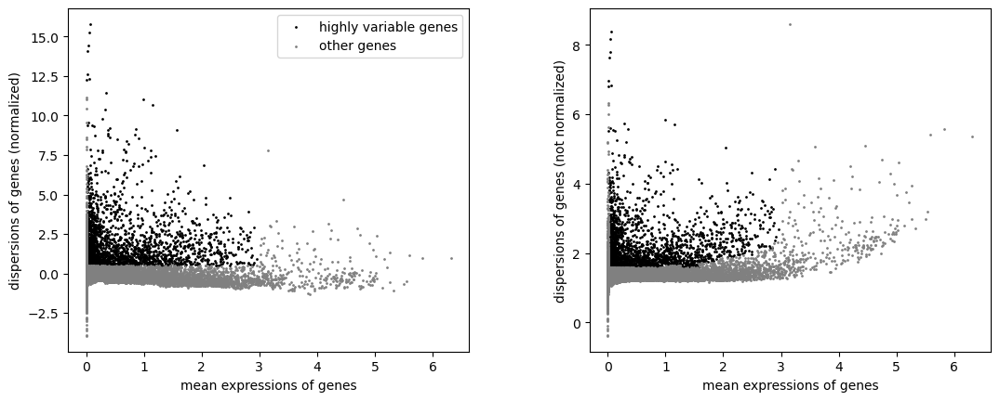

In [8]:
# Choosing to leave in hemoglobin genes for now in case they provide info about where cells were located
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

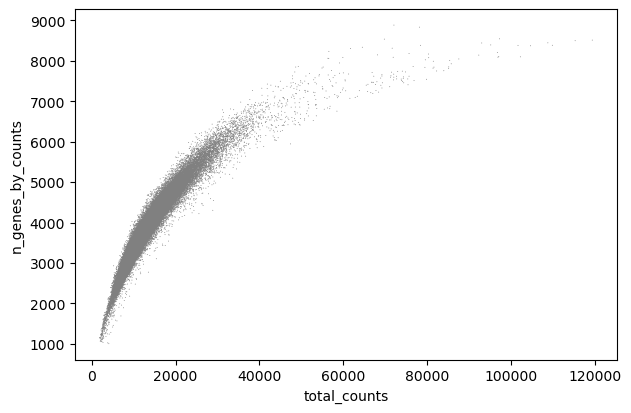

In [9]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [10]:
# For the purpose of finding clusters of cells, make a new adata object
# Set raw data to this point in analysis and filter down data to only those genes ID'd as highly variable
# Note that the genes used to ID cell type may not be the same as those used to ID features

adata_hvg = adata.copy()
adata_hvg.raw = adata_hvg
adata_hvg = adata[:, adata.var.highly_variable]



In [11]:
adata.write(os.path.join(path_results, 'adata_raw_umap.h5ad'))

### Calculate PCA

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:57)


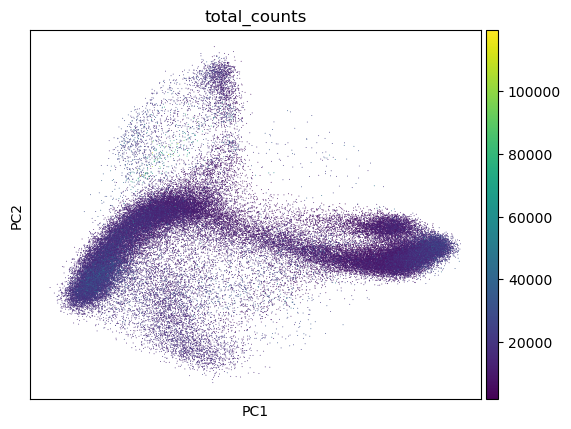

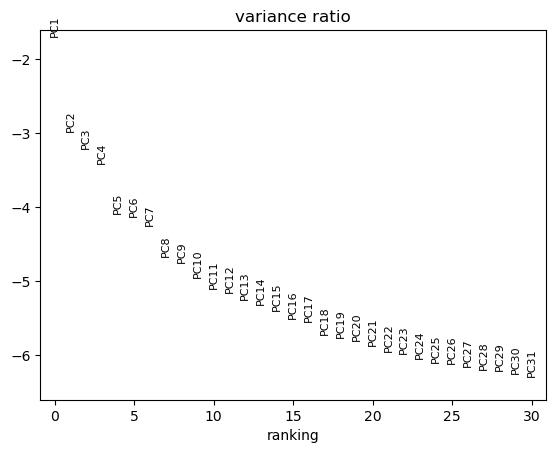

In [12]:
# Calculate PCA
## Appears to be a highly varying subset of the poulation
sc.tl.pca(adata_hvg, svd_solver='arpack')
sc.pl.pca(adata_hvg, color='total_counts') # color by genes

# examine elbow plot
sc.pl.pca_variance_ratio(adata_hvg, log=True)


## Make clusters
Compute neighborhood graph using principal components


In [13]:
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)


### Visualize with UMAP

running Leiden clustering
    finished: found 30 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:20)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:04)
--> added 'pos', the PAGA positions (adata.uns['paga'])


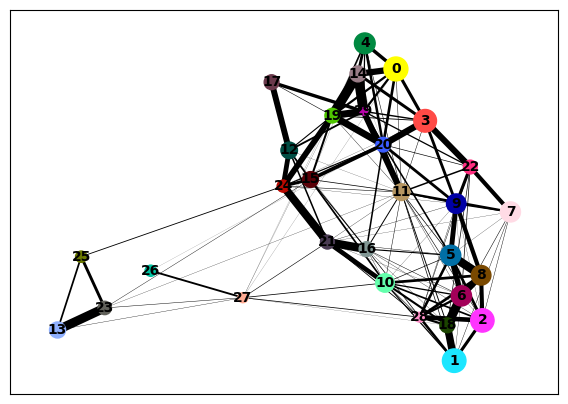

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:53)


In [14]:
sc.tl.leiden(adata_hvg)
sc.tl.paga(adata_hvg)
sc.pl.paga(adata_hvg)  # remove `plot=False` if you want to see the coarse-grained graph , plot=False
sc.tl.umap(adata_hvg, init_pos='paga')

In [15]:
# sc.tl.umap(adata_hvg)

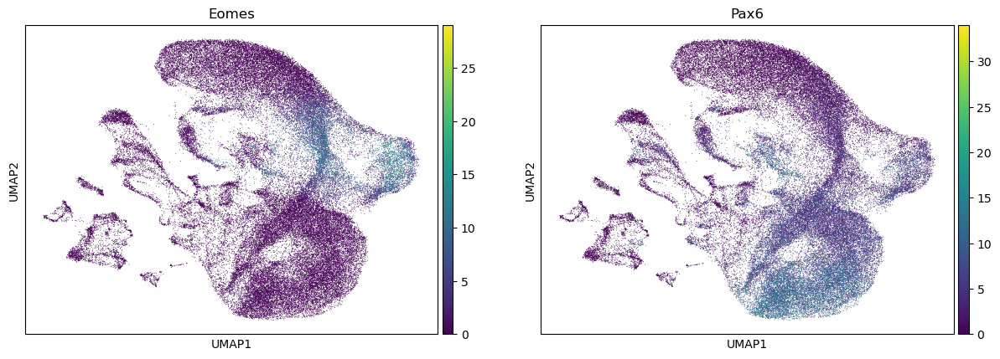

In [16]:
sc.pl.umap(adata_hvg, color=['Eomes', 'Pax6']) # can look at any gene because plotting raw


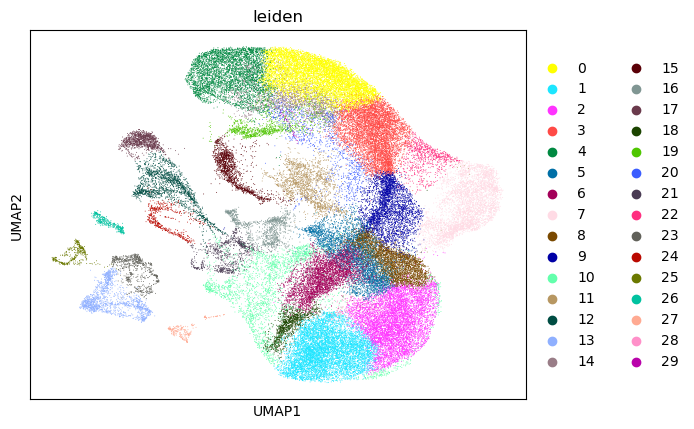

In [17]:
sc.pl.umap(adata_hvg, color = 'leiden')

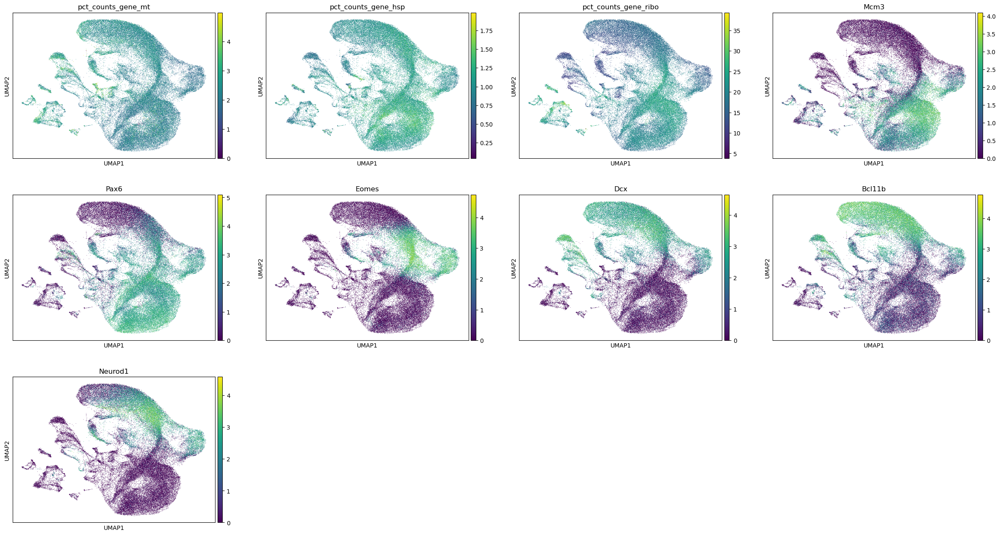

In [18]:
# Note: highly variable genes appear to be highly expressed in small handful of cells - does not feel accurate
# plots adata.X
sc.pl.umap(adata_hvg, color=['pct_counts_gene_mt', 'pct_counts_gene_hsp', 'pct_counts_gene_ribo', 
                         'Mcm3', 'Pax6', 'Eomes', 'Dcx', 'Bcl11b', 'Neurod1'], use_raw=False)


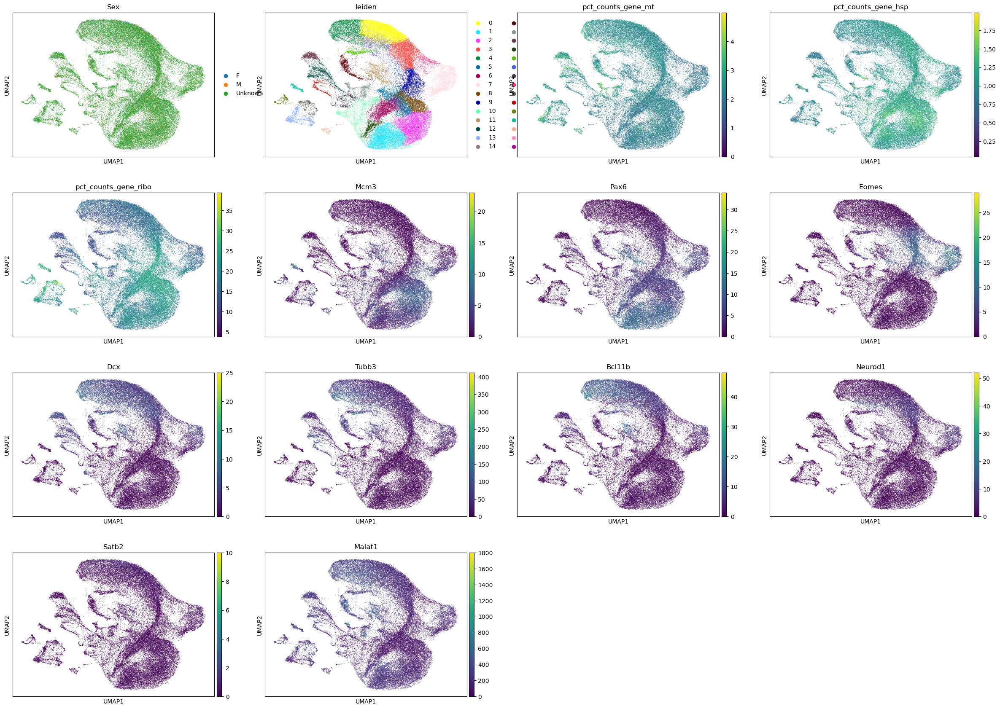

In [19]:
# Note: highly variable genes appear to be highly expressed in small handful of cells - does not feel accurate
sc.pl.umap(adata_hvg, color=['Sex', 'leiden', 'pct_counts_gene_mt', 'pct_counts_gene_hsp', 'pct_counts_gene_ribo', 
                         'Mcm3', 'Pax6', 'Eomes', 'Dcx', 'Tubb3', 'Bcl11b', 'Neurod1', 'Satb2', 'Malat1'], use_raw=True)


In [20]:
adata.write(os.path.join(path_results, 'adata_hvg_umap.h5ad'))

## Marker genes per cluster
Why Wilcoxon (Mann-Whitney U-Test): In [Pullin 2022](https://www.biorxiv.org/content/10.1101/2022.05.09.490241v1.full) and others, identified as best capturing expert annotation. It's a parametric test, so often preferred for data like scRNA-Seq data that is usually non-normal (i.e. violates assumptions of many parametric tests). It's robust to outliers, and can handle ordinal values like counts, and interpretable (produces a U-statistic; the sum of ranks in one of the groups).

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:13:42)


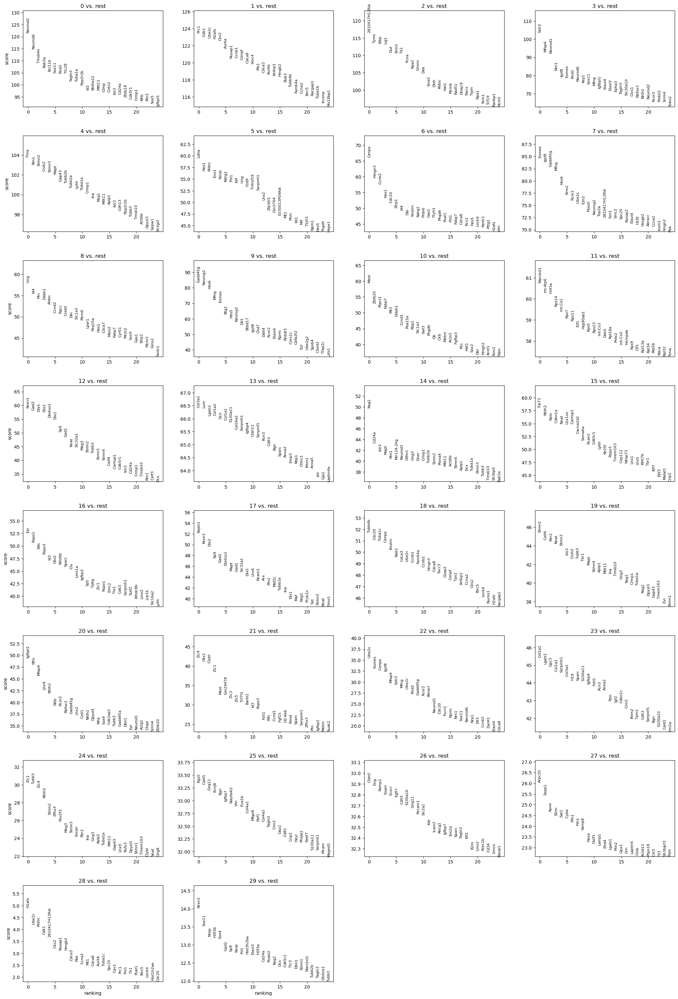

In [21]:
sc.tl.rank_genes_groups(adata_hvg, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_hvg, n_genes=25, sharey=False)

In [22]:
# show top 10 genes per cluster
pd.DataFrame(adata_hvg.uns['rank_genes_groups']['names']).head(5)


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,Neurod2,Prc1,2810417H13Rik,Sstr2,Thra,Ldha,Cenpa,Eomes,Ung,Gadd45g,...,Igfbpl1,Zic4,Ube2s,Col1a2,Zic1,Rgs5,Cldn5,Arpc1b,H2afx,Nrxn3
1,Neurod6,Cdk1,Tyms,Mfap4,Rtn1,Hes1,Hmgn3,Igsf8,Id4,Neurog2,...,Nfix,Otx2,Eomes,Lgals1,Tubb3,Cald1,Eng,Sepp1,Ube2c,Sox11
2,Tmsb4x,Ube2c,Slbp,Neurod1,Stmn2,Aldoc,Ccnb2,Gadd45g,Ptn,Hes6,...,Mfap4,Clybl,Cenpa,Gpc3,Zic4,Gng11,Ramp2,Apoe,Aldoc,Nrep
3,Rab3a,H2afx,Lig1,Nrn1,Cnih2,Eno1,Hes1,Mfng,Ddah1,Mfng,...,Lhx9,Zic1,Igsf8,Col1a1,Nhlh2,Kcnj8,Esam,B2m,Cdk1,H3f3b
4,Bcl11b,Cks2,Dut,Igsf8,Stmn3,Rmst,Cdc20,Hes6,Aldoc,Eomes,...,Nhlh2,Mest,Mfap4,Serpinh1,Stmn2,Bgn,Ecscr,Sat1,2810417H13Rik,Sox4


In [23]:
# table of group names and scores
result = adata_hvg.uns['rank_genes_groups'] # mutable mapping - unstructured annotation/ordered dictionary
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,25_n,25_p,26_n,26_p,27_n,27_p,28_n,28_p,29_n,29_p
0,Neurod2,0.0,Prc1,0.0,2810417H13Rik,0.0,Sstr2,0.0,Thra,0.0,...,Rgs5,6.264310e-244,Cldn5,1.432302e-237,Arpc1b,2.068006e-149,H2afx,8.638885e-07,Nrxn3,9.635102e-45
1,Neurod6,0.0,Cdk1,0.0,Tyms,0.0,Mfap4,0.0,Rtn1,0.0,...,Cald1,2.159320e-243,Eng,3.074367e-237,Sepp1,8.498945e-143,Ube2c,2.514632e-05,Sox11,1.166137e-41
2,Tmsb4x,0.0,Ube2c,0.0,Slbp,0.0,Neurod1,0.0,Stmn2,0.0,...,Gng11,1.092111e-241,Ramp2,1.706321e-236,Apoe,2.152820e-134,Aldoc,3.805861e-05,Nrep,5.242829e-40
3,Rab3a,0.0,H2afx,0.0,Lig1,0.0,Nrn1,0.0,Cnih2,0.0,...,Kcnj8,2.808976e-241,Esam,4.546282e-236,B2m,7.074896e-133,Cdk1,1.552595e-04,H3f3b,7.252599e-40
4,Bcl11b,0.0,Cks2,0.0,Dut,0.0,Igsf8,0.0,Stmn3,0.0,...,Bgn,1.589072e-240,Ecscr,6.351092e-236,Sat1,1.041945e-131,2810417H13Rik,2.392891e-04,Sox4,1.337100e-39


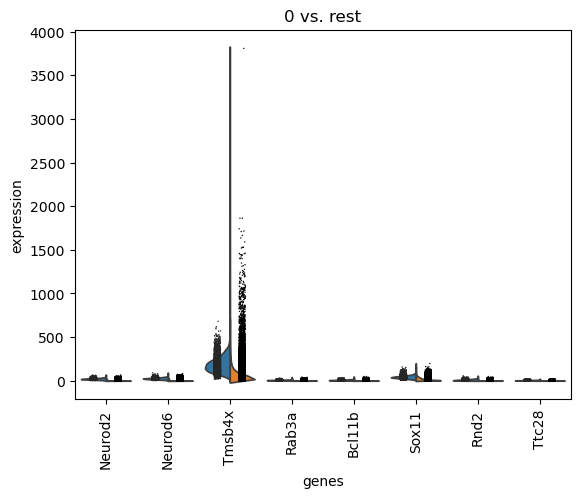

In [24]:
sc.pl.rank_genes_groups_violin(adata_hvg, groups='0', n_genes=8)

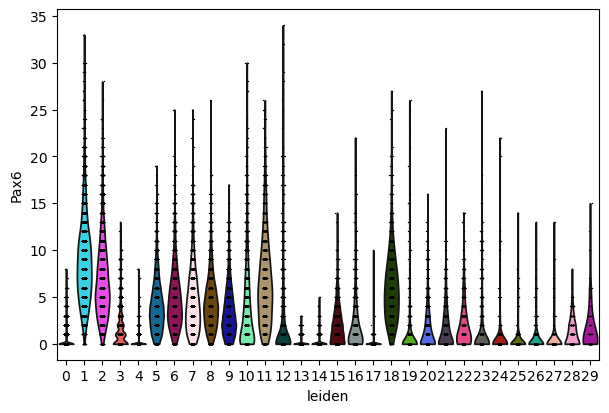

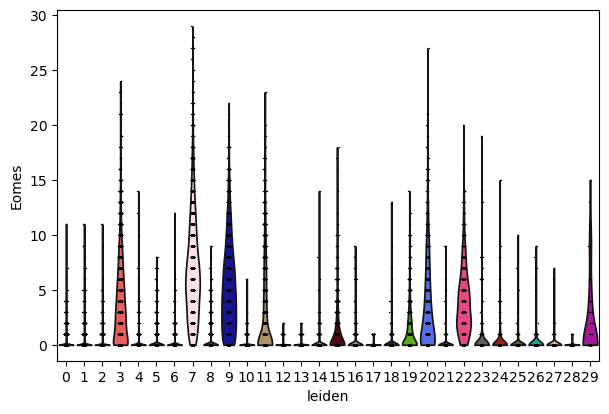

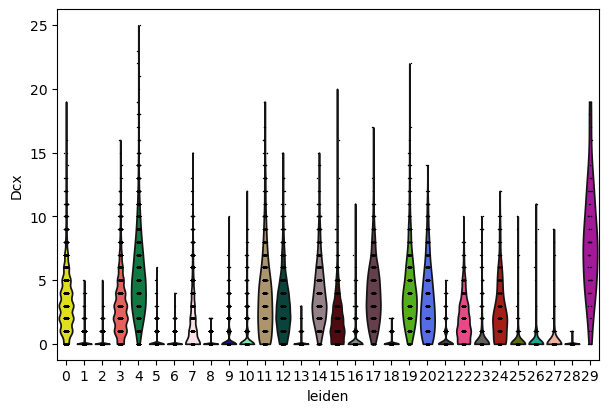

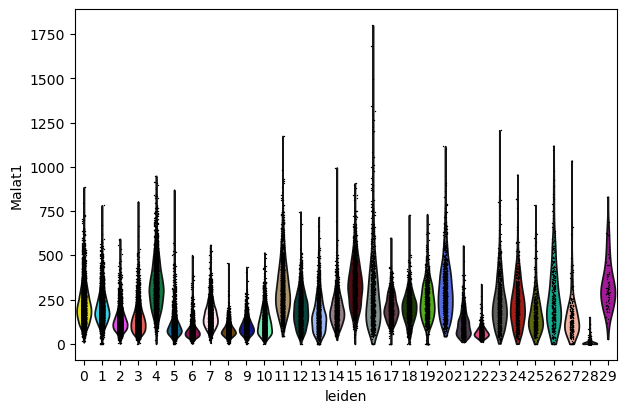

In [25]:
# compare genes across groups
sc.pl.violin(adata_hvg, ['Pax6',], groupby='leiden')
sc.pl.violin(adata_hvg, ['Eomes',], groupby='leiden')
sc.pl.violin(adata_hvg, ['Dcx'], groupby='leiden')
sc.pl.violin(adata_hvg, ['Malat1'], groupby='leiden')



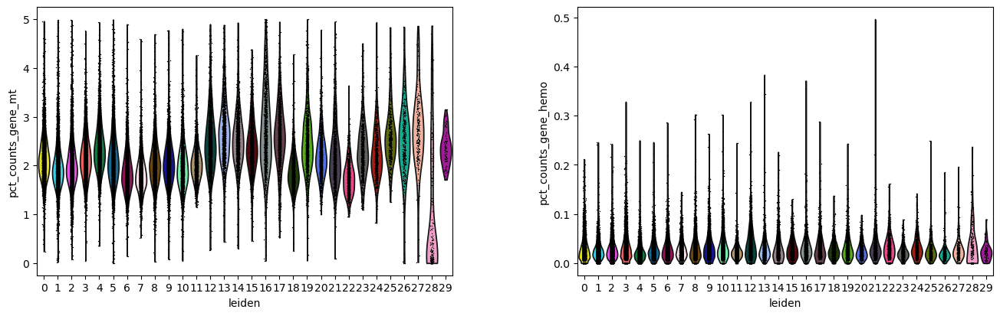

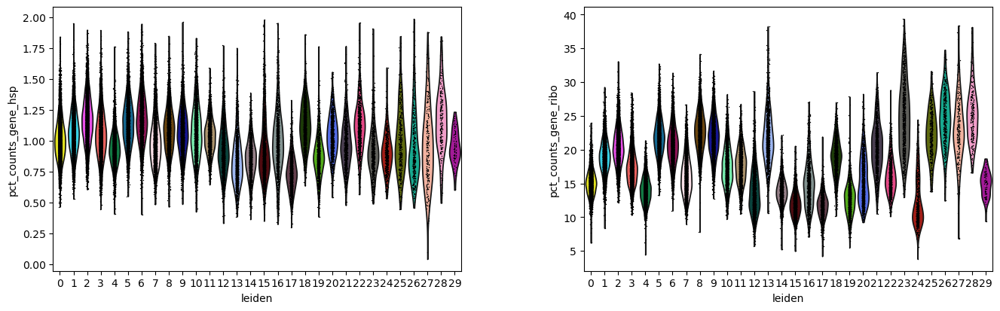

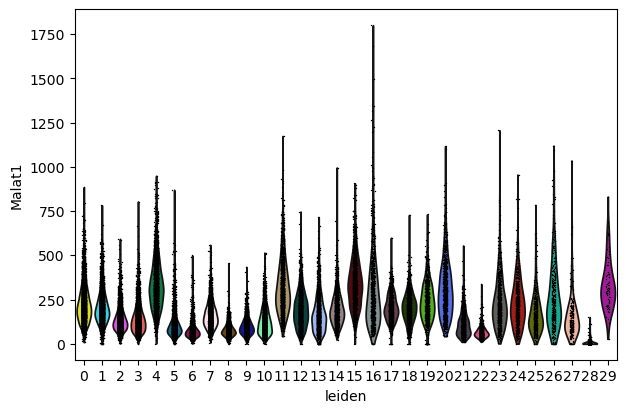

In [26]:
sc.pl.violin(adata_hvg, keys=['pct_counts_gene_mt', 'pct_counts_gene_hemo', 
                          ], groupby='leiden')
sc.pl.violin(adata_hvg, keys=['pct_counts_gene_hsp', 'pct_counts_gene_ribo', 
                          ], groupby='leiden')
sc.pl.violin(adata_hvg, keys=['Malat1', ], groupby='leiden')

Protein expression profiles differ in neurons of various layers. For instance, upper layers neurons can be identified by expression of CUX1 and POU3F2 (BRN2), the neurons of layer V by expression of BCL11B (CTIP2), and layer VI can be identified by FOXP2 expression. 

# Label Clusters

## Using biologist marker recommendations
These are usually derived from what is known to be expressed at protein level

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


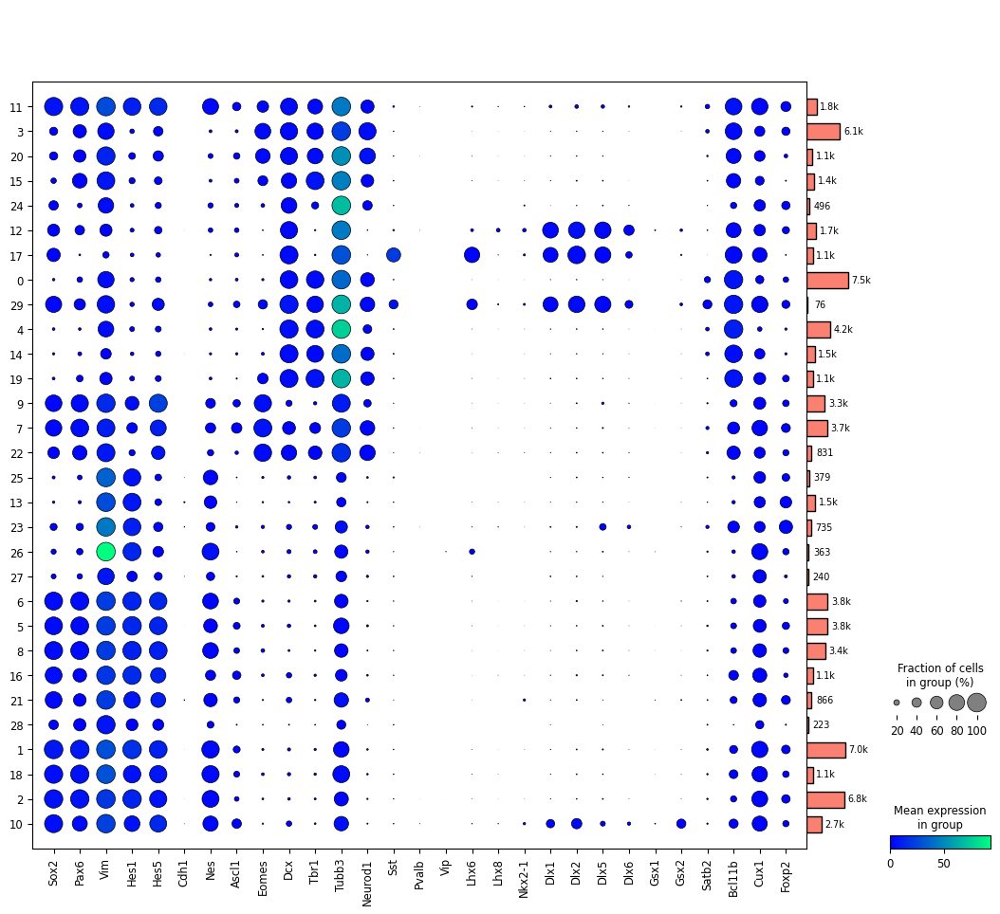

In [27]:
dp = sc.pl.dotplot(adata_hvg, marker_genes, groupby='leiden', dendrogram=True, return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [28]:
marker_RGC = ['Sox2', 'Pax6', 'Vim', 'Hes1', 'Hes5', 'Cdh1', 'Nes']

marker_IPC = ['Ascl1', 'Eomes']

marker_immature = ['Dcx', 'Tbr1', 'Tubb3', 'Neurod1']

marker_inhib = ['Sst', 'Pvalb', 'Vip', 'Lhx6', 'Lhx8', 'Nkx2-1', 'Dlx1', 'Dlx2', 'Dlx5', 'Dlx6', 'Gsx1', 'Gsx2']

marker_excit = ['Satb2', 'Bcl11b', 'Cux1', 'Foxp2']

In [29]:

dict_celltype_to_cluster = {'Immature Excitatory Neuron': ['0', ],
                            'Excitatory Neuron': ['4', '14', '19', '24', '26', ],
                            'Intermediate Progenitor Cell': ['3', '7', '9', '11', '15', '20', '22'],
                            'Inhibitory Neuron': ['10', '12', '17', '23', '26', '29'],
                            'Radial Glia with VIM': ['13', '23', '25', '27'],
                            'Radial Glial Cell': ['1', '2','5', '6', '8', '10',
                                                  '16', '18', '21', '28'] }

dict_cluster_to_celltype = {}
for key, value in dict_celltype_to_cluster.items():
    dict_cluster_to_celltype.update({clust:key for clust in value})

dict_cluster_to_celltype = {k: dict_cluster_to_celltype[k] for k in sorted(dict_cluster_to_celltype.keys())}
dict_cluster_to_celltype

adata_hvg.obs['leiden_labeled'] = adata_hvg.obs['leiden'].map(dict_cluster_to_celltype) 

dict_cellname_to_leidenlabeled = dict(zip(adata_hvg.obs.index, adata_hvg.obs['leiden_labeled']))

In [30]:
# Transfer 
adata.obs['leiden_labeled'] = adata.obs.index.map(dict_cellname_to_leidenlabeled)

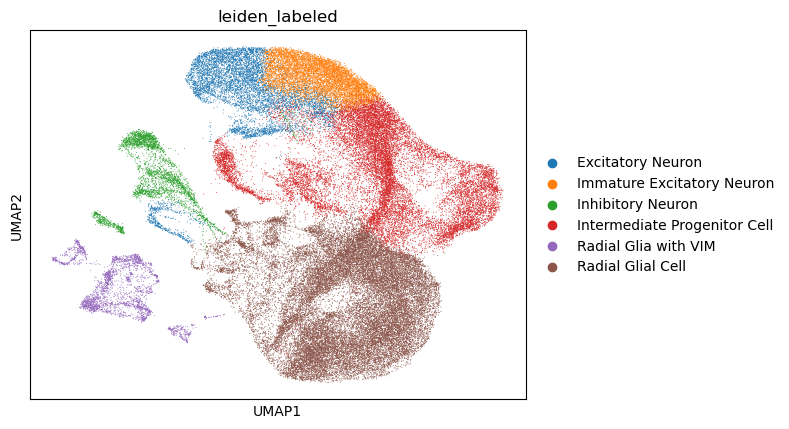

In [31]:
sc.pl.umap(adata_hvg, color = 'leiden_labeled')

# Save data

In [90]:
# save  adata_hvg? adata?
adata_hvg.write(os.path.join(path_results, 'adata_hvg_markers.h5ad'))
adata.write(os.path.join(path_results, 'adata_clusterlabels.h5ad'))
